In [8]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.image import imread
import os
import sys



import warnings
warnings.filterwarnings("ignore")

os.environ["CUDA_VISIBLE_DEVICES"] = "8"

In [9]:
from STitch3D import *

In [3]:
# spatial transcriptomics data
count = pd.read_csv("./data/Filtered/filtered_ST_matrix_and_meta_data/filtered_matrix.tsv",
                    sep="\t", index_col=0).T

meta = pd.read_csv("./data/Filtered/filtered_ST_matrix_and_meta_data/meta_data.tsv",
                   sep="\t", index_col=0)

genes_new = pd.read_csv("./data/genes_new.txt")
count.columns = list(genes_new.x.values)

count = count.loc[:, count.columns.notna()]

In [4]:
adata_st_list_raw = []

for i in range(1, 10):
    count_i = count[[loc.split("x")[0]==str(i+4) for loc in count.index]]
    count_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in count_i.index]
    meta_i = meta[[loc.split("x")[0]==str(i+4) for loc in meta.index]]
    meta_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in meta_i.index]

    loc_i = pd.read_csv("./data/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/spot_data-all-ST_Sample_6.5PCW_%d.tsv" % (i, i),
                       sep="\t")

    loc_i.index = [(str(loc_i.x.values[k]) + 'x' + str(loc_i.y.values[k])) for k in range(loc_i.shape[0])]
    loc_i = loc_i.loc[meta_i.index]

    img_i = imread('./data/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/ST_Sample_6.5PCW_%d_HE_small.jpg' % (i, i))

    adata_st_i = ad.AnnData(X = count_i.values)

    adata_st_i.obs = meta_i
    adata_st_i.obs['selected'] = loc_i['selected'].values
    adata_st_i.var.index = count_i.columns

    library_id = '0'
    adata_st_i.uns["spatial"] = dict()
    adata_st_i.uns["spatial"]['0'] = dict()
    adata_st_i.uns["spatial"]['0']['images'] = dict()
    adata_st_i.uns["spatial"]['0']['images']['hires'] = img_i
    adata_st_i.uns["spatial"]['0']['scalefactors'] = {'spot_diameter_fullres': 100,
                                                      'tissue_hires_scalef': 1.0,
                                                      'fiducial_diameter_fullres': 100,
                                                      'tissue_lowres_scalef': 1.0}

    adata_st_i.obsm['spatial'] = np.concatenate((loc_i['pixel_x'].values.reshape(-1, 1),
                                                 loc_i['pixel_y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obsm['loc_use'] = np.concatenate((loc_i['x'].values.reshape(-1, 1),
                                                 loc_i['y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obs['array_row'] = loc_i['y'].values
    adata_st_i.obs['array_col'] = loc_i['x'].values

    adata_st_i = adata_st_i[adata_st_i.obs['selected'].values != 0]
    adata_st_list_raw.append(adata_st_i.copy())

In [5]:
count_ref = pd.read_csv("./data/Filtered/share_files/all_cells_count_matrix_filtered.tsv",
                        sep='\t', index_col=0).T

meta_ref = pd.read_csv("./data/Filtered/share_files/all_cells_meta_data_filtered.tsv",
                        sep='\t', index_col=0)

adata_ref = ad.AnnData(X = count_ref.values)
adata_ref.obs.index = count_ref.index
adata_ref.var.index = count_ref.columns
for col in meta_ref.columns[:-1]:
    adata_ref.obs[col] = meta_ref.loc[count_ref.index][col].values

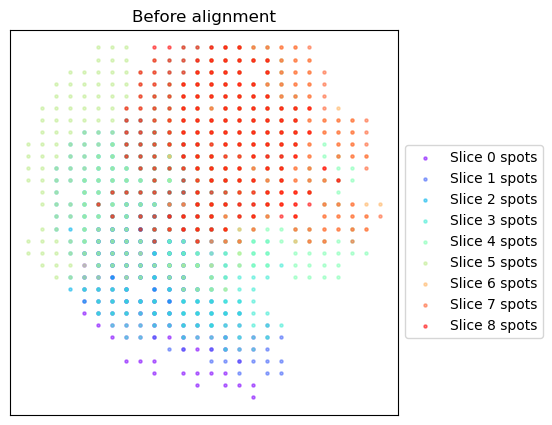

Using the Iterative Closest Point algorithm for alignemnt.
Detecting edges...
Aligning edges...


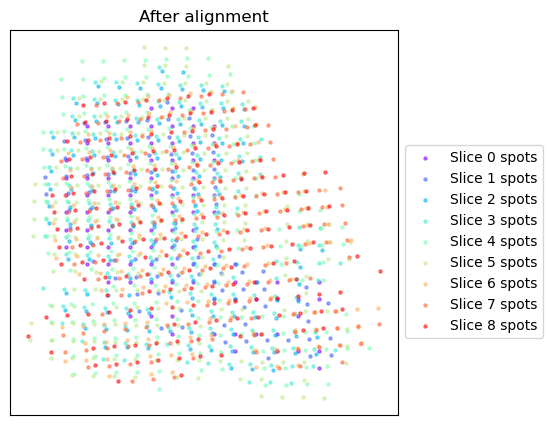

In [6]:
adata_st_list = STitch3D.utils.align_spots(adata_st_list_raw, data_type = "ST", coor_key="loc_use", test_all_angles=True, plot=True)

In [7]:
adata_st, adata_basis = STitch3D.utils.preprocess(adata_st_list,
                                                  adata_ref,
                                                  sample_col="experiment",
                                                  rad_cutoff=1.1, c2c_dist=200., coor_key="loc_use",
                                                  slice_dist_micron=[5., 115., 85., 160.,
                                                                     5., 160., 5., 155.,],
                                                  n_hvg_group=500)


Finding highly variable genes...
3837 highly variable genes selected.
Calculate basis for deconvolution...
2 batches are used for computing the basis vector of cell type <Atrial cardiomyocytes>.
2 batches are used for computing the basis vector of cell type <Capillary endothelium>.
2 batches are used for computing the basis vector of cell type <Cardiac neural crest cells >.
2 batches are used for computing the basis vector of cell type <Endothelium / pericytes >.
2 batches are used for computing the basis vector of cell type <Epicardial cells>.
2 batches are used for computing the basis vector of cell type <Epicardium-derived cells>.
2 batches are used for computing the basis vector of cell type <Erythrocytes>.
2 batches are used for computing the basis vector of cell type <Fibroblast-like >.
1 batches are used for computing the basis vector of cell type <Immune cells>.
2 batches are used for computing the basis vector of cell type <Myoz2-enriched cardiomyocytes>.
1 batches are used fo

In [10]:
model = STitch3D.model.Model(adata_st, adata_basis, training_steps = 2000)

model.train(step_interval=100)


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 1/2000 [00:00<14:53,  2.24it/s]

Step: 0, Loss: 168.2984, d_loss: 162.5888, f_loss: 57.0959


  5%|▌         | 101/2000 [00:24<06:30,  4.86it/s]

Step: 100, Loss: -535.6235, d_loss: -538.9316, f_loss: 33.0808


 10%|█         | 201/2000 [00:48<07:24,  4.05it/s]

Step: 200, Loss: -674.1894, d_loss: -677.4659, f_loss: 32.7649


 15%|█▌        | 301/2000 [01:11<06:09,  4.60it/s]

Step: 300, Loss: -771.6985, d_loss: -774.9591, f_loss: 32.6061


 20%|██        | 401/2000 [01:34<05:34,  4.79it/s]

Step: 400, Loss: -843.7126, d_loss: -846.9628, f_loss: 32.5024


 25%|██▌       | 501/2000 [01:58<06:24,  3.90it/s]

Step: 500, Loss: -897.2226, d_loss: -900.4639, f_loss: 32.4136


 30%|███       | 601/2000 [02:20<04:46,  4.89it/s]

Step: 600, Loss: -935.7767, d_loss: -939.0106, f_loss: 32.3396


 35%|███▌      | 701/2000 [02:42<04:34,  4.73it/s]

Step: 700, Loss: -963.8737, d_loss: -967.0994, f_loss: 32.2577


 40%|████      | 801/2000 [03:05<05:48,  3.44it/s]

Step: 800, Loss: -980.0501, d_loss: -983.2703, f_loss: 32.2012


 45%|████▌     | 901/2000 [03:29<04:30,  4.06it/s]

Step: 900, Loss: -994.7798, d_loss: -997.9920, f_loss: 32.1223


 50%|█████     | 1002/2000 [03:52<03:34,  4.65it/s]

Step: 1000, Loss: -1005.4536, d_loss: -1008.6566, f_loss: 32.0306


 55%|█████▌    | 1102/2000 [04:14<02:53,  5.17it/s]

Step: 1100, Loss: -1012.1729, d_loss: -1015.3688, f_loss: 31.9583


 60%|██████    | 1202/2000 [04:35<02:44,  4.85it/s]

Step: 1200, Loss: -1018.1502, d_loss: -1021.3392, f_loss: 31.8897


 65%|██████▌   | 1302/2000 [04:58<02:31,  4.59it/s]

Step: 1300, Loss: -1021.8154, d_loss: -1024.9961, f_loss: 31.8066


 70%|███████   | 1401/2000 [05:20<02:27,  4.06it/s]

Step: 1400, Loss: -1026.3516, d_loss: -1029.5232, f_loss: 31.7162


 75%|███████▌  | 1501/2000 [05:44<01:54,  4.34it/s]

Step: 1500, Loss: -1028.6050, d_loss: -1031.7701, f_loss: 31.6520


 80%|████████  | 1601/2000 [06:08<01:43,  3.84it/s]

Step: 1600, Loss: -1029.5776, d_loss: -1032.7332, f_loss: 31.5556


 85%|████████▌ | 1703/2000 [06:23<00:27, 10.97it/s]

Step: 1700, Loss: -1034.7587, d_loss: -1037.8954, f_loss: 31.3666


 90%|█████████ | 1803/2000 [06:32<00:14, 13.50it/s]

Step: 1800, Loss: -1036.8335, d_loss: -1039.9600, f_loss: 31.2652


 95%|█████████▌| 1903/2000 [06:40<00:06, 15.24it/s]

Step: 1900, Loss: -1037.9047, d_loss: -1041.0197, f_loss: 31.1503


100%|██████████| 2000/2000 [06:47<00:00,  4.91it/s]


In [11]:
save_path = "./results/human_heart/raw"

result = model.eval(adata_st_list_raw, save=True, output_path=save_path)

In [12]:
# save adata_st

model.adata_st.write_h5ad(save_path + "/model.adata_st.h5ad")

In [25]:
model.adata_st

AnnData object with n_obs × n_vars = 1480 × 3837
    obs: 'nGene', 'nUMI', 'Sample', 'weeks', 'ChipBatch', 'ChipNr', 'Experiment_date', 'Experiment_procedure', 'Sequencing_date', 'Raw_reads', 'new_x', 'new_y', 'percent.mito', 'res.0.8', 'selected', 'array_row', 'array_col', 'slice', 'batch', 'library_size'
    uns: 'log1p', 'neighbors', 'umap'
    obsm: 'spatial', 'loc_use', 'spatial_aligned', 'count', 'graph', '3D_coor', 'latent', 'X_umap'
    obsp: 'distances', 'connectivities'

Slice 1


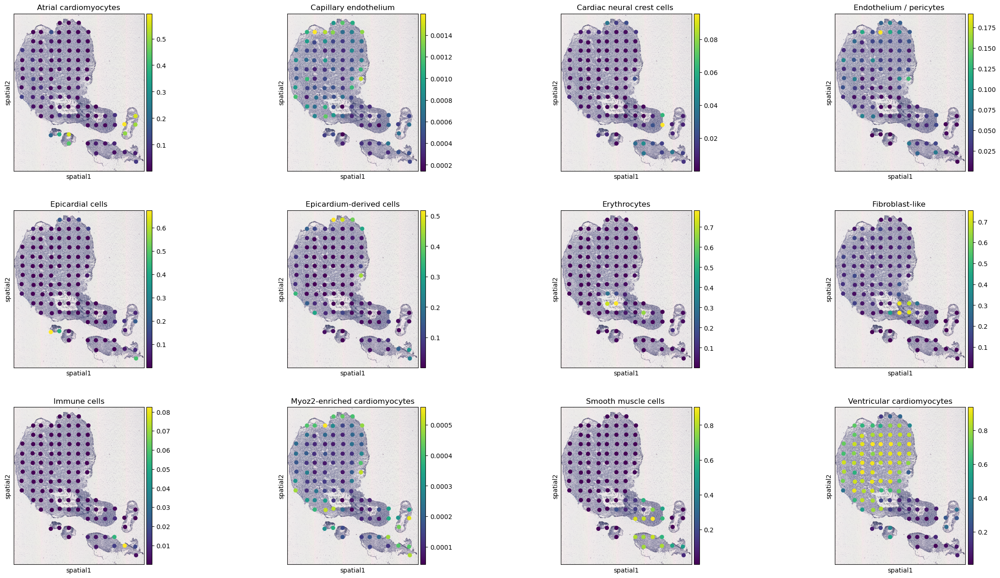

Slice 2


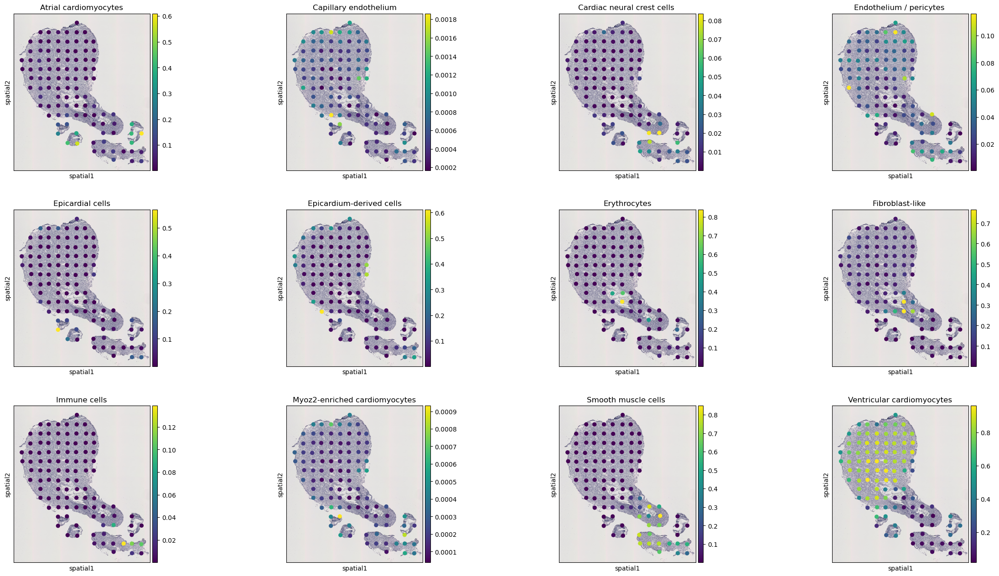

Slice 3


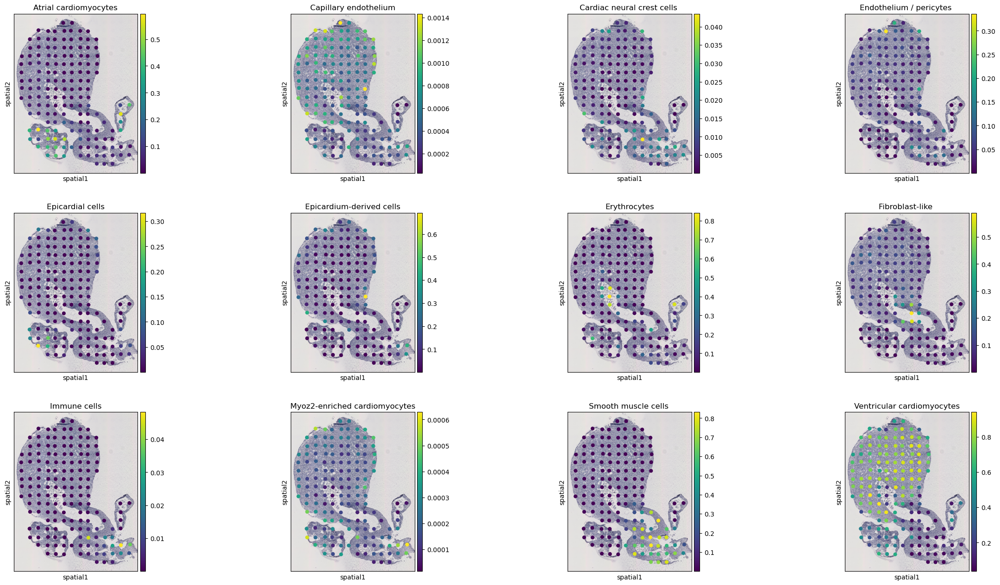

Slice 4


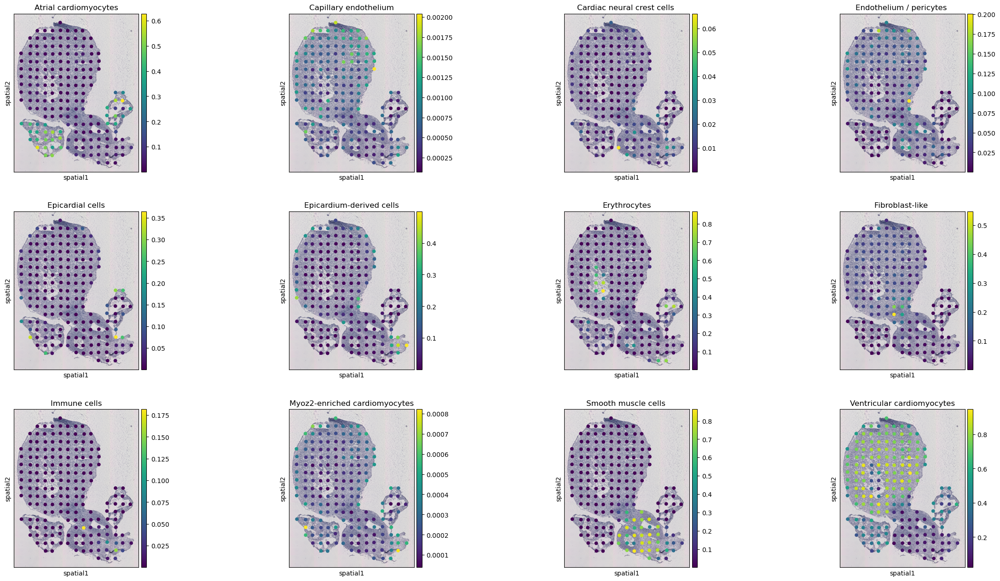

Slice 5


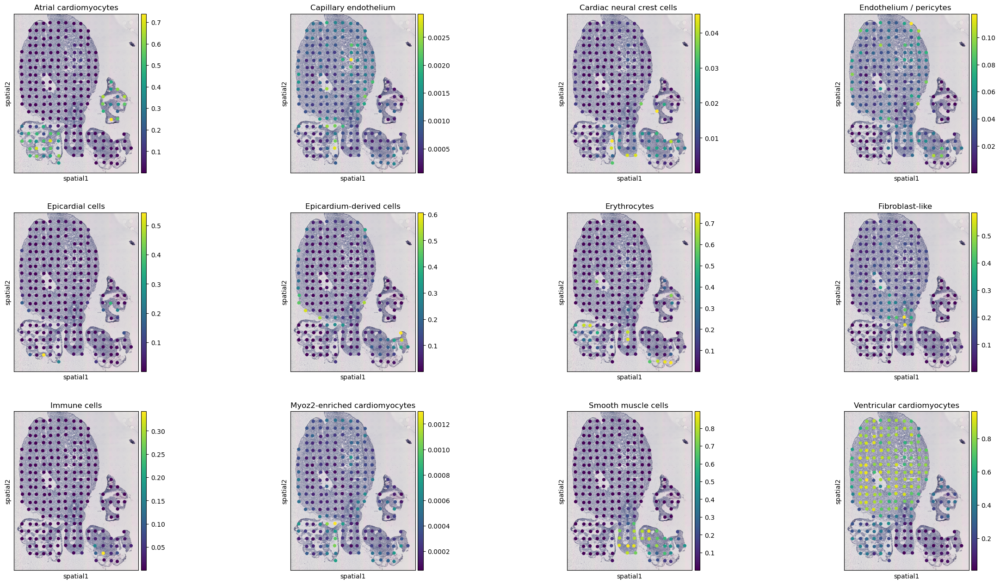

Slice 6


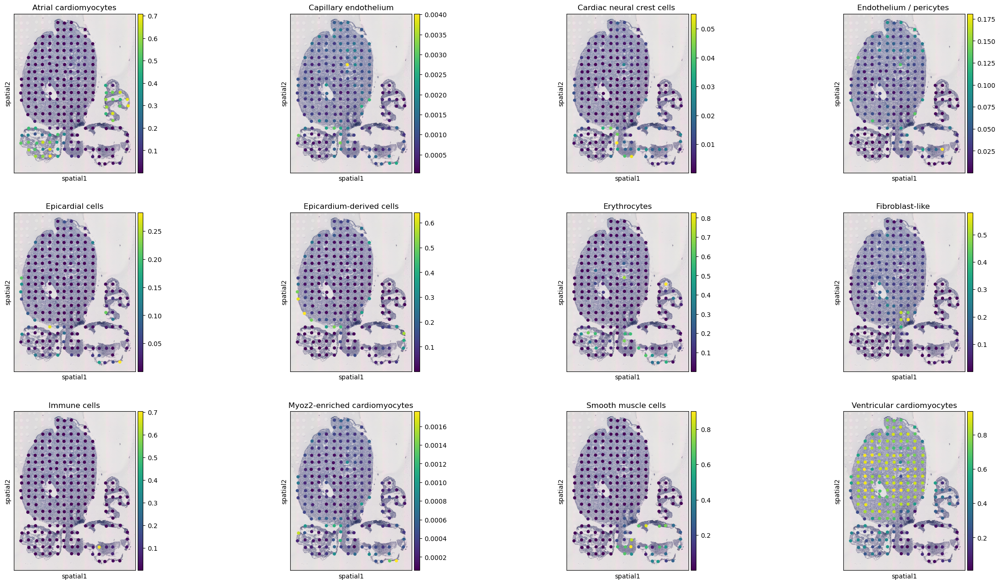

Slice 7


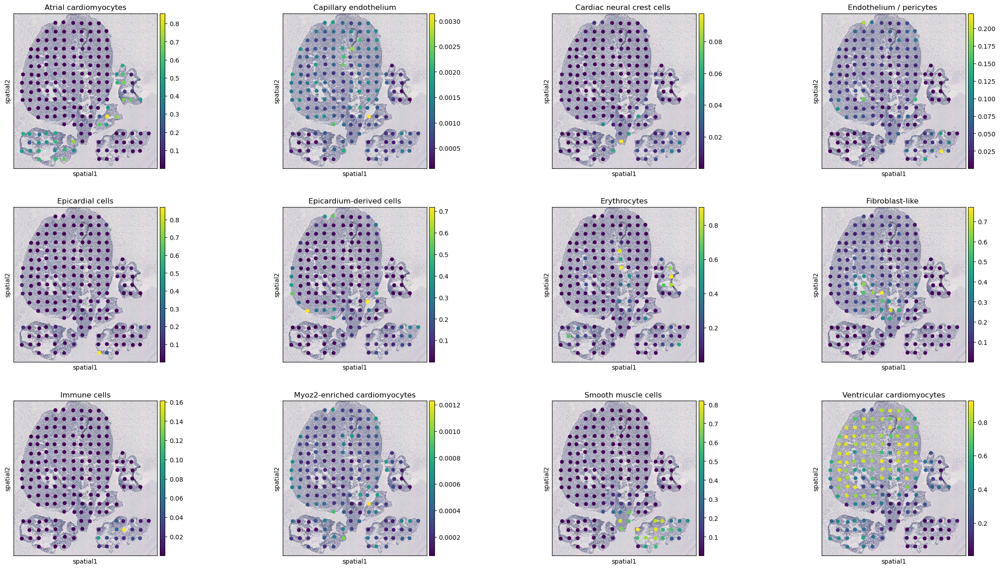

Slice 8


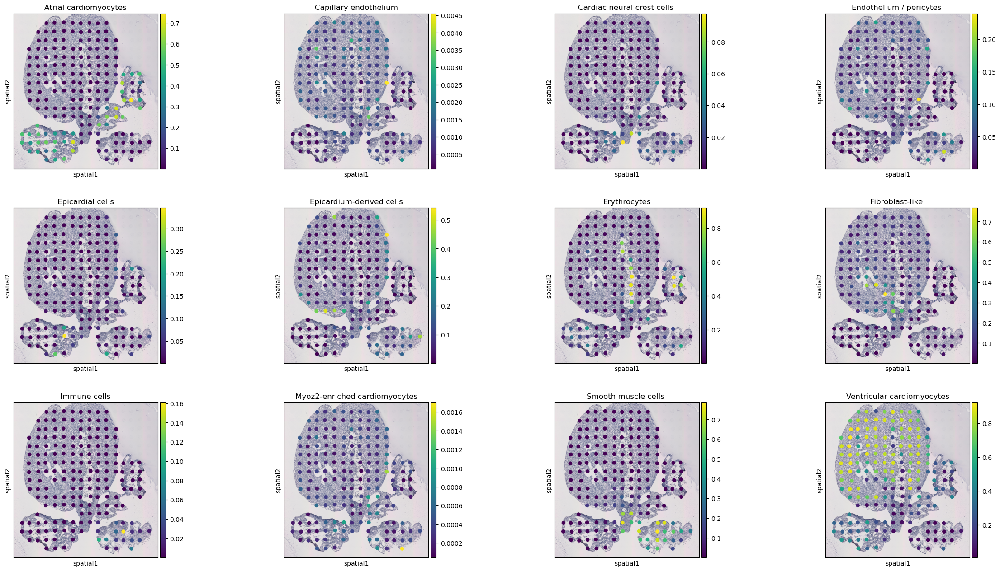

Slice 9


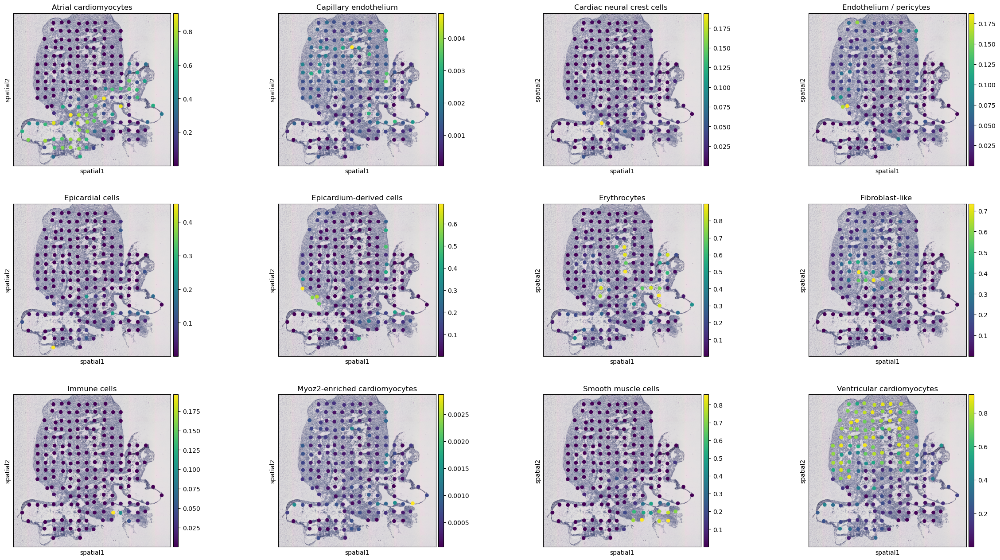

In [13]:
for i, adata_st_i in enumerate(result):
    print("Slice %d" % (i+1))
    sc.pl.spatial(adata_st_i, img_key="hires", color=model.celltypes, size=1.)

In [13]:
sc.pp.neighbors(model.adata_st, use_rep='latent', n_neighbors=30)
sc.tl.louvain(model.adata_st, resolution=0.5)

model.adata_st.obs["louvain"].to_csv(os.path.join(save_path, "clustering_result.csv"))

In [14]:
for i, adata_st_i in enumerate(result):
    adata_st_i.obs["louvain"] = model.adata_st.obs.loc[adata_st_i.obs_names, ]["louvain"]

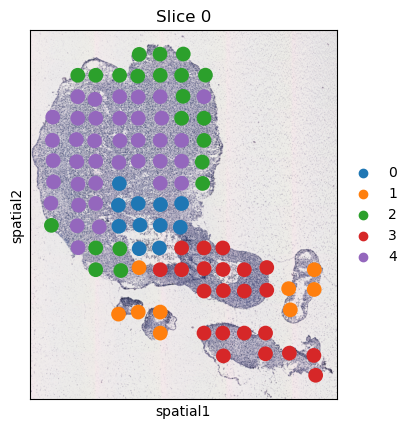

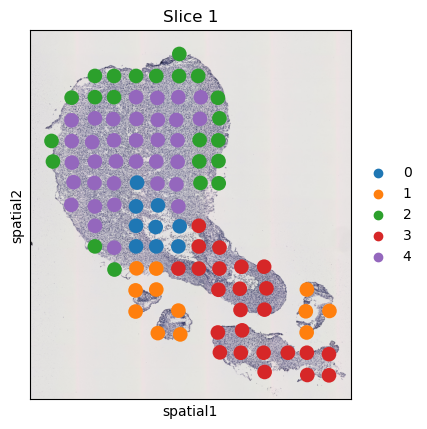

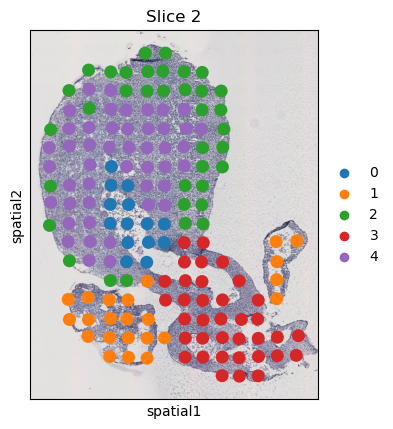

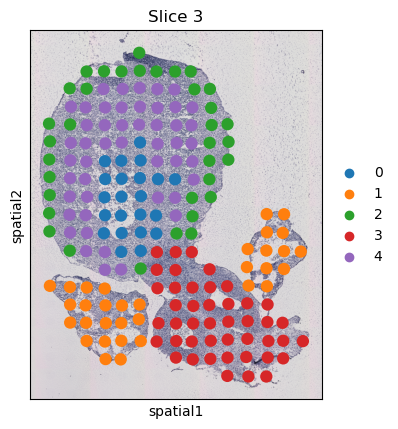

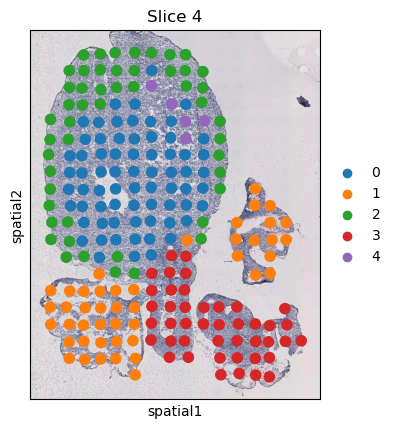

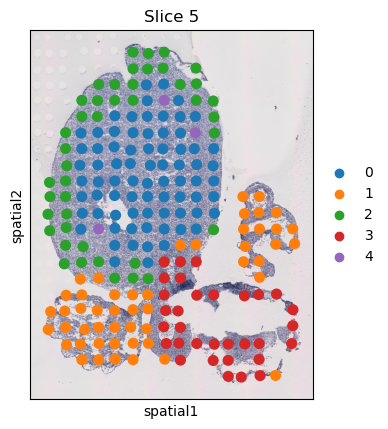

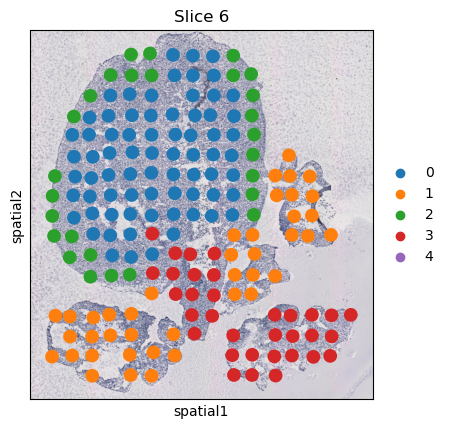

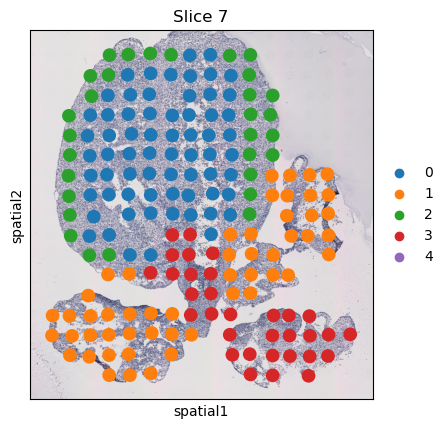

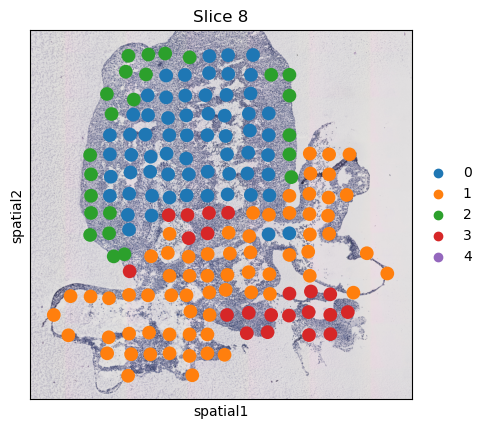

In [16]:
for i, adata_st_i in enumerate(result):
    sc.pl.spatial(result[i], img_key="hires", color=["louvain"], size=1.5, title="Slice %d" % (i),)